In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import math as math
import seaborn as sns
import plotly as plotly
import plotly.express as px
import plotly.graph_objects as go

1. Historical trends over the timeframe for each dataset (Global and ME)
    Analyze trends of migration vs population swings
    GDP vs migration
    pull in crime data? additional economic data?
2. Correlation analysis of GDP vs migration
    can we get education levels of migrants?
    industries for migrants?
    subsector by country in ME?
3. Is there a correlation between GDP and migration trends?
4. If large outflows of migration occurs, what societal issues occur?
    look for news articles? terrorism and/or crime?

In [2]:
# GD Data
df_gdp = pd.read_csv("GDP/API_NY.GDP.MKTP.CD_DS2_en_csv_v2_9865.csv")

In [3]:
Bad_lst = ["Africa Eastern and Southern", "Africa Western and Central", "Arab World", "Central Europe and the Baltics",
           "Caribbean small states", "East Asia & Pacific (excluding high income)",
             "Early-demographic dividend", "East Asia & Pacific", "Europe & Central Asia (excluding high income)",
            "Europe & Central Asia", "European Union", "Fragile and conflict affected situations",
            "High income", "Heavily indebted poor countries (HIPC)", "IBRD only", 
            "IDA & IBRD total", "IDA total", "IDA blend", "IDA only", "Not classified",
              "Latin America & Caribbean (excluding high income)", "Latin America & Caribbean",
              "Least developed countries: UN classification", "Low income", "Lower middle income",
              "Low & middle income", "Late-demographic dividend", "Middle East & North Africa", 
              "Middle income", "Middle East & North Africa (excluding high income)",
              "North America", "OECD members", "Other small states", "Pre-demographic dividend",
              "Pacific island small states", "Post-demographic dividend", "Sub-Saharan Africa (excluding high income)",
              "Small states", "East Asia & Pacific (IDA & IBRD countries)", "Europe & Central Asia (IDA & IBRD countries)",
              "Latin America & the Caribbean (IDA & IBRD countries)", "Middle East & North Africa (IDA & IBRD countries)", 
              "South Asia (IDA & IBRD)", "Sub-Saharan Africa (IDA & IBRD countries)", "Upper middle income",
              "World", "Euro area","South Asia"]

In [4]:
df_gdp = df_gdp.drop(df_gdp[df_gdp["Country Name"].isin(Bad_lst)].index)

In [5]:
df_gdp_no_US = df_gdp.drop(df_gdp[df_gdp["Country Name"] == "United States"].index)

In [6]:
df_gdp.describe()

,1960,1961,1962,1963,1964,1965,1966,1967,1968,1969,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
count,1.050000e+02,1.070000e+02,1.090000e+02,1.090000e+02,1.090000e+02,1.170000e+02,1.180000e+02,1.210000e+02,1.220000e+02,1.220000e+02,...,2.130000e+02,2.110000e+02,2.110000e+02,2.110000e+02,2.110000e+02,2.110000e+02,2.100000e+02,2.090000e+02,2.030000e+02,1.860000e+02
mean,1.204807e+10,1.248038e+10,1.314707e+10,1.418652e+10,1.556923e+10,1.584982e+10,1.701220e+10,1.769349e+10,1.899484e+10,2.096429e+10,...,3.812227e+11,3.611416e+11,3.662463e+11,3.899475e+11,4.148471e+11,4.209085e+11,4.108443e+11,4.697475e+11,5.022890e+11,5.686799e+11
std,5.446686e+10,5.610802e+10,5.976861e+10,6.324604e+10,6.814846e+10,7.148550e+10,7.789643e+10,8.141631e+10,8.859970e+10,9.623619e+10,...,1.517051e+12,1.553724e+12,1.594218e+12,1.682390e+12,1.802396e+12,1.862588e+12,1.864006e+12,2.124825e+12,2.267628e+12,2.463810e+12
min,1.201202e+07,1.159202e+07,9.122751e+06,1.084010e+07,1.271247e+07,1.359393e+07,1.446908e+07,1.583511e+07,1.460000e+07,1.585000e+07,...,3.876098e+07,3.681194e+07,4.162906e+07,4.527660e+07,4.801526e+07,5.412320e+07,5.174659e+07,6.019641e+07,5.906598e+07,6.228031e+07
25%,2.888844e+08,2.965599e+08,2.892007e+08,3.451750e+08,3.720121e+08,3.003922e+08,3.035008e+08,3.062220e+08,3.329169e+08,3.494584e+08,...,6.393318e+09,5.982932e+09,6.154236e+09,6.409347e+09,6.860961e+09,6.395734e+09,6.475459e+09,7.710380e+09,9.069453e+09,1.401181e+10
50%,1.052990e+09,1.076700e+09,1.117602e+09,1.200447e+09,1.309748e+09,1.210058e+09,1.255597e+09,1.246481e+09,1.452653e+09,1.687647e+09,...,2.322591e+10,2.289076e+10,2.371367e+10,2.497919e+10,2.626085e+10,2.594702e+10,2.507419e+10,2.814433e+10,3.160362e+10,4.750368e+10
75%,4.335192e+09,4.895319e+09,5.081414e+09,5.505023e+09,5.964196e+09,5.906637e+09,6.421495e+09,6.016017e+09,6.968522e+09,8.172742e+09,...,2.013380e+11,1.779940e+11,1.737540e+11,1.885495e+11,2.032005e+11,1.993565e+11,1.784448e+11,2.096920e+11,2.466115e+11,3.231902e+11
max,5.419890e+11,5.619400e+11,6.036390e+11,6.370590e+11,6.841450e+11,7.419050e+11,8.130330e+11,8.596200e+11,9.402250e+11,1.017440e+12,...,1.760810e+13,1.829500e+13,1.880490e+13,1.961210e+13,2.065650e+13,2.152140e+13,2.132300e+13,2.359400e+13,2.574410e+13,2.736090e+13


In [7]:
df_gdp.info()

<class 'pandas.core.frame.DataFrame'>
Index: 218 entries, 0 to 265
Data columns (total 68 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Country Name    218 non-null    object 
 1   Country Code    218 non-null    object 
 2   Indicator Name  218 non-null    object 
 3   Indicator Code  218 non-null    object 
 4   1960            105 non-null    float64
 5   1961            107 non-null    float64
 6   1962            109 non-null    float64
 7   1963            109 non-null    float64
 8   1964            109 non-null    float64
 9   1965            117 non-null    float64
 10  1966            118 non-null    float64
 11  1967            121 non-null    float64
 12  1968            122 non-null    float64
 13  1969            122 non-null    float64
 14  1970            142 non-null    float64
 15  1971            143 non-null    float64
 16  1972            143 non-null    float64
 17  1973            143 non-null    float64


In [8]:
df_gdp.T

,0,2,4,5,6,8,9,10,11,12,...,255,256,257,258,260,261,262,263,264,265
Country Name,Aruba,Afghanistan,Angola,Albania,Andorra,United Arab Emirates,Argentina,Armenia,American Samoa,Antigua and Barbuda,...,British Virgin Islands,Virgin Islands (U.S.),Viet Nam,Vanuatu,Samoa,Kosovo,"Yemen, Rep.",South Africa,Zambia,Zimbabwe
Country Code,ABW,AFG,AGO,ALB,AND,ARE,ARG,ARM,ASM,ATG,...,VGB,VIR,VNM,VUT,WSM,XKX,YEM,ZAF,ZMB,ZWE
Indicator Name,GDP (current US$),GDP (current US$),GDP (current US$),GDP (current US$),GDP (current US$),GDP (current US$),GDP (current US$),GDP (current US$),GDP (current US$),GDP (current US$),...,GDP (current US$),GDP (current US$),GDP (current US$),GDP (current US$),GDP (current US$),GDP (current US$),GDP (current US$),GDP (current US$),GDP (current US$),GDP (current US$)
Indicator Code,NY.GDP.MKTP.CD,NY.GDP.MKTP.CD,NY.GDP.MKTP.CD,NY.GDP.MKTP.CD,NY.GDP.MKTP.CD,NY.GDP.MKTP.CD,NY.GDP.MKTP.CD,NY.GDP.MKTP.CD,NY.GDP.MKTP.CD,NY.GDP.MKTP.CD,...,NY.GDP.MKTP.CD,NY.GDP.MKTP.CD,NY.GDP.MKTP.CD,NY.GDP.MKTP.CD,NY.GDP.MKTP.CD,NY.GDP.MKTP.CD,NY.GDP.MKTP.CD,NY.GDP.MKTP.CD,NY.GDP.MKTP.CD,NY.GDP.MKTP.CD
1960,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8748596501.0,713000000.0,1052990400.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019,3395798883.0,18799444490.0,70897962732.0,15401826127.0,3155149348.0,417990000000.0,447755000000.0,13619290539.0,647000000.0,1725351852.0,...,NaN,4121000000.0,334365000000.0,936526267.6,912950466.1,7899737577.0,NaN,389330000000.0,23308667781.0,21832234926.0
2020,2558906304.0,19955929052.0,48501561204.0,15162734205.0,2891001149.0,349473000000.0,385741000000.0,12641698583.0,721000000.0,1410796296.0,...,NaN,4189000000.0,346616000000.0,909421043.5,868898358.3,7717145218.0,NaN,338291000000.0,18137764931.0,21509698406.0
2021,3103184102.0,14266499430.0,66505129988.0,17930565119.0,3324683012.0,415179000000.0,487903000000.0,13878908629.0,750000000.0,1601366667.0,...,NaN,4444000000.0,366475000000.0,950394006.5,843923638.7,9413403724.0,NaN,420118000000.0,22096416932.0,28371238666.0
2022,3544707788.0,14502158192.0,104400000000.0,18916378861.0,3380602043.0,507064000000.0,631133000000.0,19513474648.0,871000000.0,1867733333.0,...,NaN,NaN,410324000000.0,1022219298.0,832945205.6,9354903062.0,NaN,405271000000.0,29163782140.0,27366627153.0


Shifting the GDP Data to where the YEARS is in one Column

In [9]:
# Reshape the dataframe to have 'Year' and 'GDP (current US$)' columns
df_gdp_melted = df_gdp.melt(id_vars=["Country Name", "Country Code"], 
                            var_name="Year", 
                            value_name="GDP (current US$)", 
                            value_vars=df_gdp.columns[4:68])

# Convert the 'Year' column to numeric
df_gdp_melted["Year"] = pd.to_numeric(df_gdp_melted["Year"])


In [10]:

# Function to create a world map for a given dataframe and year
def create_world_map(df, year_column, value_column, title):
    fig = px.choropleth(
        df,
        locations="Country Code",
        color=value_column,
        hover_name="Country Name",
        animation_frame=year_column,
        title=title,
        color_continuous_scale=px.colors.sequential.Plasma
    )
    fig.update_layout(width= 1500, height=1000, coloraxis_colorbar=dict(orientation='h', y=-0.05))
    
    for i in fig.frames:
        year = i.name
        year_frame = df[df["Year"] == year]
        min_gdp = year_frame["GDP (current US$)"].min()
        max_gdp = year_frame["GDP (current US$)"].max()
        i.data[0].update(zmin=min_gdp, zmax=max_gdp)

    init_year = df["Year"].min()
    init_year_frame = df[df["Year"] == init_year]
    init_min_gdp = init_year_frame["GDP (current US$)"].min()
    init_max_gdp = init_year_frame["GDP (current US$)"].max()
    fig.data[0].update(zmin=init_min_gdp, zmax=init_max_gdp)
    
    fig.show()

# Create world map for the reshaped GDP dataframe
create_world_map(df_gdp_melted, 'Year', 'GDP (current US$)', 'World GDP Over Time')

US is excluded

In [11]:
# Reshape the dataframe to have 'Year' and 'GDP (current US$)' columns
df_gdp_melted_no_US = df_gdp_no_US.melt(id_vars=["Country Name", "Country Code"], 
                            var_name="Year", 
                            value_name="GDP (current US$)", 
                            value_vars=df_gdp.columns[4:68])

# Convert the 'Year' column to numeric
df_gdp_melted_no_US["Year"] = pd.to_numeric(df_gdp_melted_no_US["Year"])


In [73]:

# Function to create a world map for a given dataframe and year
def create_world_map(df, year_column, value_column, title):
    fig = px.choropleth(
        df,
        locations="Country Code",
        color=value_column,
        hover_name="Country Name",
        animation_frame=year_column,
        title=title,
        color_continuous_scale=px.colors.sequential.Plasma
    )
    fig.update_layout(width= 1500, height=1000, coloraxis_colorbar=dict(orientation='h', y=-0.05))

    for i in fig.frames:
        year = i.name
        year_frame = df[df["Year"] == year]
        min_gdp = year_frame["GDP (current US$)"].min()
        max_gdp = year_frame["GDP (current US$)"].max()
        i.data[0].update(zmin=min_gdp, zmax=max_gdp)

    init_year = df["Year"].min()
    init_year_frame = df[df["Year"] == init_year]
    init_min_gdp = init_year_frame["GDP (current US$)"].min()
    init_max_gdp = init_year_frame["GDP (current US$)"].max()
    fig.data[0].update(zmin=init_min_gdp, zmax=init_max_gdp)

    fig.show()

# Create world map for the reshaped GDP dataframe
create_world_map(df_gdp_melted_no_US, 'Year', 'GDP (current US$)', 'World GDPs Over Time Excluding the US (in $US)')

In [13]:
df_gdp_melted_no_US[df_gdp_melted_no_US["Year"] == 1960].sort_values("GDP (current US$)", ascending=False)


,Country Name,Country Code,Year,GDP (current US$)
50,Germany,DEU,1960,8.431095e+10
68,United Kingdom,GBR,1960,7.323397e+10
64,France,FRA,1960,6.222548e+10
36,China,CHN,1960,5.971625e+10
98,Japan,JPN,1960,4.741924e+10
...,...,...,...,...
209,Viet Nam,VNM,1960,NaN
210,Vanuatu,VUT,1960,NaN
211,Samoa,WSM,1960,NaN
212,Kosovo,XKX,1960,NaN


In [14]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go

# Reshape the dataframe to have 'Year' and 'GDP (current US$)' columns
df_gdp_melted_no_US = df_gdp_no_US.melt(id_vars=["Country Name", "Country Code"], 
                                        var_name="Year", 
                                        value_name="GDP (current US$)", 
                                        value_vars=df_gdp.columns[4:68])

# Convert the 'Year' column to numeric
df_gdp_melted_no_US["Year"] = pd.to_numeric(df_gdp_melted_no_US["Year"])


In [15]:

# Function to create a world map with dynamic color scales for each year
def create_dynamic_world_map(df, year_column, value_column, title):
    # Extract unique years
    unique_years = df[year_column].unique()
    unique_years.sort()  # Ensure years are in order

    # Create the figure
    fig = go.Figure()

    # Loop over each year to create a separate trace with its own color scale
    for year in unique_years:
        year_frame = df[df[year_column] == year]
        min_gdp = year_frame[value_column].min()
        max_gdp = year_frame[value_column].max()

        # Create a choropleth trace for each year with specific zmin and zmax
        fig.add_trace(go.Choropleth(
            locations=year_frame["Country Code"],
            z=year_frame[value_column],
            locationmode='ISO-3',
            text=year_frame["Country Name"],
            colorscale="Plasma",
            zmin=min_gdp,
            zmax=max_gdp,
            colorbar_title="GDP (current US$)",
            visible=False  # Make all frames invisible initially
        ))

    # Set the first trace (first year) as visible
    fig.data[0].visible = True

    # Create slider steps to update the visible trace
    steps = []
    for i, year in enumerate(unique_years):
        step = dict(
            method="update",
            args=[{"visible": [False] * len(unique_years)},  # Hide all traces
                  {"title": f"{title} - {year}"}],  # Update title to reflect year
        )
        step["args"][0]["visible"][i] = True  # Only make the current year trace visible
        steps.append(step)

    # Add the slider to the figure layout
    fig.update_layout(
        sliders=[dict(
            active=0,
            currentvalue={"prefix": "Year: "},
            pad={"t": 50},
            steps=steps
        )],
        width=1500,
        height=1000,
        title=title,
        coloraxis_colorbar=dict(orientation='h', y=-0.05)
    )

    fig.show()

# Create the dynamic world map
create_dynamic_world_map(df_gdp_melted_no_US, 'Year', 'GDP (current US$)', 'World GDP Over Time')


In [16]:
#Migration Data
df_mig = pd.read_csv("Migration/API_SM.POP.NETM_DS2_en_csv_v2_10087.csv")

In [17]:
df_mig = df_mig.drop(df_mig[df_mig["Country Name"].isin(Bad_lst)].index)

In [18]:
df_mig.describe()

,1960,1961,1962,1963,1964,1965,1966,1967,1968,1969,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
count,218.000000,218.000000,218.000000,218.000000,218.000000,218.000000,218.000000,218.000000,218.000000,218.000000,...,2.180000e+02,2.180000e+02,2.180000e+02,2.180000e+02,2.180000e+02,2.180000e+02,2.180000e+02,218.000000,2.180000e+02,2.180000e+02
mean,-541.986239,-364.394495,-478.977064,-463.747706,-280.266055,-279.550459,-431.536697,169.587156,175.646789,2.137615,...,-2.376885e+03,3.302752e+01,-4.858353e+03,-2.645367e+03,-3.004766e+03,-2.513156e+03,-8.164037e+02,-2171.995413,-2.243060e+03,-2.218817e+03
std,51711.644467,52747.373114,54631.794848,56776.614359,52746.811462,53095.144366,46440.015467,48605.474695,54279.242415,61112.235060,...,2.271038e+05,2.101704e+05,2.240320e+05,1.830901e+05,1.895648e+05,1.678486e+05,1.184754e+05,94090.800659,5.305352e+05,1.786527e+05
min,-161432.000000,-221620.000000,-232922.000000,-239948.000000,-241630.000000,-242177.000000,-250618.000000,-236043.000000,-235037.000000,-250039.000000,...,-2.037911e+06,-2.172159e+06,-2.290411e+06,-1.574581e+06,-1.356759e+06,-1.177218e+06,-1.025295e+06,-525116.000000,-6.673580e+06,-9.104750e+05
25%,-3800.750000,-4060.000000,-4824.250000,-5643.500000,-5757.000000,-6235.000000,-6965.500000,-7213.500000,-8174.750000,-9823.750000,...,-2.077350e+04,-1.646375e+04,-1.355675e+04,-1.344050e+04,-1.514100e+04,-1.691275e+04,-9.714000e+03,-10559.500000,-9.781250e+03,-9.999000e+03
50%,-59.000000,-42.500000,-15.000000,-25.000000,-87.500000,-89.000000,-65.000000,0.000000,-176.000000,-192.500000,...,-8.320000e+02,-8.595000e+02,-3.890000e+02,-4.370000e+02,-8.120000e+02,-1.324000e+03,-3.050000e+02,-665.500000,-5.500000e+02,-8.250000e+02
75%,2120.000000,2716.000000,2947.500000,3143.500000,2831.250000,2478.500000,2761.500000,3095.500000,2916.250000,2605.500000,...,6.845000e+03,8.469500e+03,1.307200e+04,9.474250e+03,9.899250e+03,4.830500e+03,2.522250e+03,1798.500000,1.000000e+03,5.787500e+02
max,583458.000000,541424.000000,549734.000000,588381.000000,501115.000000,497365.000000,337814.000000,377776.000000,502456.000000,669129.000000,...,1.250914e+06,1.221849e+06,1.449371e+06,1.377630e+06,1.200796e+06,1.158444e+06,6.755600e+05,561580.000000,3.366387e+06,1.784718e+06


In [19]:
df_mig.head()

,Country Name,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
0,Aruba,ABW,Net migration,SM.POP.NETM,0.0,-569.0,-609.0,-646.0,-684.0,-726.0,...,88.0,177.0,170.0,218.0,367.0,412.0,0.0,501.0,164.0,157.0
2,Afghanistan,AFG,Net migration,SM.POP.NETM,2606.0,6109.0,7016.0,6681.0,7079.0,10695.0,...,255611.0,-281739.0,-90238.0,-47090.0,-47205.0,-8082.0,166821.0,-183672.0,-65846.0,-65846.0
4,Angola,AGO,Net migration,SM.POP.NETM,-43749.0,-49186.0,-54566.0,-59777.0,-71948.0,-87288.0,...,84532.0,74170.0,91623.0,77733.0,61632.0,58986.0,7557.0,29089.0,-1000.0,-1000.0
5,Albania,ALB,Net migration,SM.POP.NETM,15540.0,15424.0,15288.0,15007.0,14612.0,14209.0,...,-14265.0,-12240.0,-10887.0,-9768.0,-9106.0,-8889.0,-9117.0,-10612.0,-8000.0,-8000.0
6,Andorra,AND,Net migration,SM.POP.NETM,642.0,653.0,664.0,670.0,672.0,669.0,...,-84.0,-232.0,1303.0,887.0,1184.0,1238.0,1474.0,1377.0,200.0,200.0


In [20]:
# # Reshape the dataframe to have 'Year' and 'Net Migration' columns
df_mig_melted = df_mig.melt(id_vars=["Country Name", "Country Code"], 
                            var_name="Year", 
                            value_name="Net Migration", 
                            value_vars=df_mig.columns[4:68])

# Convert the 'Year' column to numeric
df_mig_melted["Year"] = pd.to_numeric(df_mig_melted["Year"])


Net Migration Around the World

In [21]:

# Function to create a world map for a given dataframe and year
def create_world_map(df, year_column, value_column, title):
    fig = px.choropleth(
        df,
        locations="Country Code",
        color=value_column,
        hover_name="Country Name",
        animation_frame=year_column,
        title=title,
        color_continuous_scale=px.colors.sequential.Plasma
    )
    fig.update_layout(width= 1500, height=1000, coloraxis_colorbar=dict(orientation='h', y=-0.05))
    
    # for i in fig.frames:
    #     year = i.name
    #     year_frame = df[df["Year"] == year]
    #     min_gdp = year_frame["GDP (current US$)"].min()
    #     max_gdp = year_frame["GDP (current US$)"].max()
    #     i.data[0].update(zmin=min_gdp, zmax=max_gdp)

    # init_year = df["Year"].min()
    # init_year_frame = df[df["Year"] == init_year]
    # init_min_gdp = init_year_frame["GDP (current US$)"].min()
    # init_max_gdp = init_year_frame["GDP (current US$)"].max()
    # fig.data[0].update(zmin=init_min_gdp, zmax=init_max_gdp)
    
    fig.show()

# Create world map for the reshaped GDP dataframe
create_world_map(df_mig_melted, 'Year', 'Net Migration', 'World Migrations Over Time')

Migration (Log Scale)

In [22]:
# Apply log transformation to the 'Net Migration' column to normalize values
df_mig_melted['Net Migration (log)'] = np.log1p(df_mig_melted['Net Migration'].abs()) * np.sign(df_mig_melted['Net Migration'])


In [23]:

# Function to create the dynamic world map with normalized (log-transformed) migration values
def create_normalized_world_map(df, year_column, value_column, title):
    fig = px.choropleth(
        df,
        locations="Country Code",
        color=value_column,
        hover_name="Country Name",
        animation_frame=year_column,
        title=title,
        color_continuous_scale=px.colors.sequential.Plasma,
        range_color=(df[value_column].min(), df[value_column].max())
    )
    fig.update_layout(width=1500, height=1000, coloraxis_colorbar=dict(orientation='h', y=-0.05))
    fig.show()

# Generate the normalized dynamic map using the cleaned and log-transformed data
create_normalized_world_map(df_mig_melted, 'Year', 'Net Migration (log)', 'World Net Migrations Over Time (Log Scale)')


In [24]:
df_mig_melted

,Country Name,Country Code,Year,Net Migration,Net Migration (log)
0,Aruba,ABW,1960,0.0,0.000000
1,Afghanistan,AFG,1960,2606.0,7.865955
2,Angola,AGO,1960,-43749.0,-10.686247
3,Albania,ALB,1960,15540.0,9.651237
4,Andorra,AND,1960,642.0,6.466145
...,...,...,...,...,...
13947,Kosovo,XKX,2023,-5000.0,-8.517393
13948,"Yemen, Rep.",YEM,2023,-29914.0,-10.306115
13949,South Africa,ZAF,2023,58496.0,10.976731
13950,Zambia,ZMB,2023,-5000.0,-8.517393


In [25]:
df_mig_melted[df_mig_melted["Country Code"] == "AFG"]

,Country Name,Country Code,Year,Net Migration,Net Migration (log)
1,Afghanistan,AFG,1960,2606.0,7.865955
219,Afghanistan,AFG,1961,6109.0,8.717682
437,Afghanistan,AFG,1962,7016.0,8.856091
655,Afghanistan,AFG,1963,6681.0,8.807173
873,Afghanistan,AFG,1964,7079.0,8.865029
...,...,...,...,...,...
12863,Afghanistan,AFG,2019,-8082.0,-8.997518
13081,Afghanistan,AFG,2020,166821.0,12.024683
13299,Afghanistan,AFG,2021,-183672.0,-12.120912
13517,Afghanistan,AFG,2022,-65846.0,-11.095089


POPULATION!!!!!!!!!

In [26]:
df_pop = pd.read_csv("Population/Population_data.csv")

In [27]:
df_pop = df_pop.drop(df_pop[df_pop["Country Name"].isin(Bad_lst)].index)

In [28]:
df_pop.info()

<class 'pandas.core.frame.DataFrame'>
Index: 218 entries, 0 to 265
Data columns (total 68 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Country Name    218 non-null    object 
 1   Country Code    218 non-null    object 
 2   Indicator Name  218 non-null    object 
 3   Indicator Code  218 non-null    object 
 4   1960            217 non-null    float64
 5   1961            217 non-null    float64
 6   1962            217 non-null    float64
 7   1963            217 non-null    float64
 8   1964            217 non-null    float64
 9   1965            217 non-null    float64
 10  1966            217 non-null    float64
 11  1967            217 non-null    float64
 12  1968            217 non-null    float64
 13  1969            217 non-null    float64
 14  1970            217 non-null    float64
 15  1971            217 non-null    float64
 16  1972            217 non-null    float64
 17  1973            217 non-null    float64


In [29]:
df_pop.describe()

,1960,1961,1962,1963,1964,1965,1966,1967,1968,1969,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
count,2.170000e+02,2.170000e+02,2.170000e+02,2.170000e+02,2.170000e+02,2.170000e+02,2.170000e+02,2.170000e+02,2.170000e+02,2.170000e+02,...,2.180000e+02,2.180000e+02,2.180000e+02,2.180000e+02,2.180000e+02,2.180000e+02,2.180000e+02,2.180000e+02,2.180000e+02,2.180000e+02
mean,1.497127e+07,1.518378e+07,1.545955e+07,1.579229e+07,1.612813e+07,1.646853e+07,1.682118e+07,1.717428e+07,1.753657e+07,1.791129e+07,...,3.796064e+07,3.848389e+07,3.900736e+07,3.952955e+07,4.004591e+07,4.055359e+07,4.105041e+07,4.149835e+07,4.192477e+07,4.240148e+07
std,5.899056e+07,5.919507e+07,6.003736e+07,6.145205e+07,6.285254e+07,6.429293e+07,6.589299e+07,6.744899e+07,6.906799e+07,7.078907e+07,...,1.476506e+08,1.495155e+08,1.514000e+08,1.533129e+08,1.551521e+08,1.569291e+08,1.586533e+08,1.602040e+08,1.616637e+08,1.631923e+08
min,2.646000e+03,2.888000e+03,3.171000e+03,3.481000e+03,3.811000e+03,4.161000e+03,4.531000e+03,4.930000e+03,5.354000e+03,5.646000e+03,...,1.089900e+04,1.087700e+04,1.085200e+04,1.082800e+04,1.086500e+04,1.095600e+04,1.106900e+04,1.120400e+04,1.131200e+04,1.139600e+04
25%,2.325500e+05,2.336980e+05,2.348290e+05,2.402680e+05,2.474440e+05,2.550100e+05,2.629760e+05,2.713390e+05,2.801020e+05,2.892960e+05,...,7.400465e+05,7.462132e+05,7.520925e+05,7.620610e+05,7.786132e+05,7.929278e+05,7.994430e+05,8.088315e+05,8.157380e+05,8.233942e+05
50%,2.371800e+06,2.419700e+06,2.482000e+06,2.531800e+06,2.585400e+06,2.628400e+06,2.675900e+06,2.736500e+06,2.806566e+06,2.894800e+06,...,6.153220e+06,6.211650e+06,6.262617e+06,6.311029e+06,6.383064e+06,6.493113e+06,6.599298e+06,6.719538e+06,6.564773e+06,6.567063e+06
75%,8.141820e+06,8.271216e+06,8.363578e+06,8.579350e+06,8.825046e+06,8.994936e+06,9.104743e+06,9.326268e+06,9.491502e+06,9.646032e+06,...,2.282156e+07,2.345072e+07,2.407109e+07,2.454274e+07,2.504837e+07,2.565029e+07,2.581291e+07,2.590028e+07,2.617334e+07,2.706177e+07
max,6.670700e+08,6.603300e+08,6.657700e+08,6.823350e+08,6.983550e+08,7.151850e+08,7.354000e+08,7.545500e+08,7.745100e+08,7.960250e+08,...,1.371860e+09,1.379860e+09,1.387790e+09,1.396215e+09,1.402760e+09,1.407745e+09,1.411100e+09,1.412360e+09,1.417173e+09,1.428628e+09


In [30]:
df_pop.head()

,Country Name,Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
0,Aruba,ABW,"Population, total",SP.POP.TOTL,54608.0,55811.0,56682.0,57475.0,58178.0,58782.0,...,103594.0,104257.0,104874.0,105439.0,105962.0,106442.0,106585.0,106537.0,106445.0,106277.0
2,Afghanistan,AFG,"Population, total",SP.POP.TOTL,8622466.0,8790140.0,8969047.0,9157465.0,9355514.0,9565147.0,...,32716210.0,33753499.0,34636207.0,35643418.0,36686784.0,37769499.0,38972230.0,40099462.0,41128771.0,42239854.0
4,Angola,AGO,"Population, total",SP.POP.TOTL,5357195.0,5441333.0,5521400.0,5599827.0,5673199.0,5736582.0,...,27128337.0,28127721.0,29154746.0,30208628.0,31273533.0,32353588.0,33428486.0,34503774.0,35588987.0,36684202.0
5,Albania,ALB,"Population, total",SP.POP.TOTL,1608800.0,1659800.0,1711319.0,1762621.0,1814135.0,1864791.0,...,2889104.0,2880703.0,2876101.0,2873457.0,2866376.0,2854191.0,2837849.0,2811666.0,2777689.0,2745972.0
6,Andorra,AND,"Population, total",SP.POP.TOTL,9443.0,10216.0,11014.0,11839.0,12690.0,13563.0,...,71621.0,71746.0,72540.0,73837.0,75013.0,76343.0,77700.0,79034.0,79824.0,80088.0


Populations Over Time Raw Numbers

In [31]:
# Reshape the dataframe to have 'Year' and 'World Populations' columns
df_pop_melted = df_pop.melt(id_vars=["Country Name", "Country Code"], 
                            var_name="Year", 
                            value_name="Current Population", 
                            value_vars=df_gdp.columns[4:68])

# Convert the 'Year' column to numeric
df_pop_melted["Year"] = pd.to_numeric(df_pop_melted["Year"])


In [32]:

# Function to create a world map for a given dataframe and year
def create_world_map(df, year_column, value_column, title):
    fig = px.choropleth(
        df,
        locations="Country Code",
        color=value_column,
        hover_name="Country Name",
        animation_frame=year_column,
        title=title,
        color_continuous_scale=px.colors.sequential.Plasma
    )
    fig.update_layout(width= 1500, height=1000, coloraxis_colorbar=dict(orientation='h', y=-0.05))
    
    for i in fig.frames:
        year = i.name
        year_frame = df[df["Year"] == year]
        min_pop = year_frame["Current Population"].min()
        max_pop = year_frame["Current Population"].max()
        i.data[0].update(zmin=min_pop, zmax=max_pop)

    init_year = df["Year"].min()
    init_year_frame = df[df["Year"] == init_year]
    init_min_pop = init_year_frame["Current Population"].min()
    init_max_pop = init_year_frame["Current Population"].max()
    fig.data[0].update(zmin=init_min_pop, zmax=init_max_pop)
    
    fig.show()

# Create world map for the reshaped GDP dataframe
create_world_map(df_pop_melted, 'Year', 'Current Population', 'World Populations Over Time')

In [33]:
df_pop_melted.head(100)

,Country Name,Country Code,Year,Current Population
0,Aruba,ABW,1960,54608.0
1,Afghanistan,AFG,1960,8622466.0
2,Angola,AGO,1960,5357195.0
3,Albania,ALB,1960,1608800.0
4,Andorra,AND,1960,9443.0
...,...,...,...,...
95,Italy,ITA,1960,50199700.0
96,Jamaica,JAM,1960,1642331.0
97,Jordan,JOR,1960,847936.0
98,Japan,JPN,1960,93216000.0


Population Log Scale

In [34]:
# Apply log transformation to the 'Net Migration' column to normalize values
df_pop_melted['Population (log)'] = np.log1p(df_pop_melted['Current Population'].abs()) * np.sign(df_pop_melted['Current Population'])


World Populations (Log Scale)

In [35]:

# Function to create the dynamic world map with normalized (log-transformed) migration values
def create_normalized_world_map(df, year_column, value_column, title):
    fig = px.choropleth(
        df,
        locations="Country Code",
        color=value_column,
        hover_name="Country Name",
        animation_frame=year_column,
        title=title,
        color_continuous_scale=px.colors.sequential.Plasma,
        range_color=(df[value_column].min(), df[value_column].max())
    )
    fig.update_layout(width=1500, height=1000, coloraxis_colorbar=dict(orientation='h', y=-0.05))
    fig.show()

# Generate the normalized dynamic map using the cleaned and log-transformed data
create_normalized_world_map(df_pop_melted, 'Year', 'Population (log)', 'World Populations Over Time (Log Scale)')


In [36]:
df_pop_melted[df_pop_melted["Country Code"] == "USA"]

,Country Name,Country Code,Year,Current Population,Population (log)
204,United States,USA,1960,180671000.0,19.012188
422,United States,USA,1961,183691000.0,19.028766
640,United States,USA,1962,186538000.0,19.044146
858,United States,USA,1963,189242000.0,19.058537
1076,United States,USA,1964,191889000.0,19.072428
...,...,...,...,...,...
13066,United States,USA,2019,328329953.0,19.609530
13284,United States,USA,2020,331526933.0,19.619220
13502,United States,USA,2021,332048977.0,19.620793
13720,United States,USA,2022,333271411.0,19.624468


In [37]:
df_MEAF_eco = pd.read_csv("ME N Af Eco/ME_NAf_eco.csv")

In [38]:
# # Function to create a world map for a given dataframe and year
# def create_world_map(df, year_column, value_column, title):
#     fig = px.choropleth(
#         df,
#         locations="Country Code",
#         color=value_column,
#         hover_name="Country Name",
#         animation_frame=year_column,
#         title=title,
#         color_continuous_scale=px.colors.sequential.Plasma
#     )
#     fig.show()

# # Create world maps for each dataframe
# create_world_map(df_gdp_melted, 'Year', 'GDP (current US$)', 'World GDP Over Time')
# create_world_map(df_mig_melted, 'Year', 'Net migration', 'World Net Migration Over Time')
# create_world_map(df_pop_melted, 'Year', 'Population, total', 'World Population Over Time')
# # create_world_map(df_MEAF_eco, 'Year', 'High-technology exports (% of manufactured exports)', 'High-technology Exports Over Time')

CORRELATION ANALYSIS

In [39]:
# Merge the dataframes on Country Code and Year
df_merged = pd.merge(df_gdp_melted, df_mig_melted, on=["Country Code", "Year"], suffixes=('_gdp', '_mig'))
df_merged = pd.merge(df_merged, df_pop_melted, on=["Country Code", "Year"])

# Calculate the correlation matrix
correlation_matrix = df_merged[["GDP (current US$)", "Net Migration", "Current Population"]].corr()

print(correlation_matrix)

                    GDP (current US$)  Net Migration  Current Population
GDP (current US$)            1.000000       0.332225            0.384616
Net Migration                0.332225       1.000000           -0.137342
Current Population           0.384616      -0.137342            1.000000


In [40]:
# import pandas as pd
# import plotly.graph_objects as go

# # Assuming df_gdp_melted, df_mig_melted, and df_pop_melted are already defined and loaded

# # Step 1: Merge the dataframes on Country Code and Year
# df_merged = pd.merge(df_gdp_melted, df_mig_melted, on=["Country Code", "Year"], suffixes=('_gdp', '_mig'))
# df_merged = pd.merge(df_merged, df_pop_melted, on=["Country Code", "Year"])

# # Step 2: Create a dictionary to store correlation matrices for each country
# country_corr_matrices = {}

# for country in df_merged['Country Name'].unique():
#     country_data = df_merged[df_merged['Country Name'] == country]
#     corr_matrix = country_data[['GDP (current US$)', 'Net Migration', 'Current Population']].corr()
#     country_corr_matrices[country] = corr_matrix

# # Step 3: Create a heatmap figure with dropdowns
# fig = go.Figure()

# # Add each country's correlation matrix as a separate heatmap trace, initially invisible
# for country, matrix in country_corr_matrices.items():
#     fig.add_trace(
#         go.Heatmap(
#             z=matrix.values,
#             x=matrix.columns,
#             y=matrix.columns,
#             visible=False,
#             coloraxis="coloraxis",
#             name=country
#               # Add text to show the correlation values
#         )
#     )

# # Step 4: Create a dropdown menu for country selection
# dropdown_buttons = [
#     {
#         "method": "update",
#         "label": country,
#         "args": [
#             {"visible": [trace.name == country for trace in fig.data]},  # Show selected country's matrix
#             {"title": f"Correlation Matrix for {country}"}
#         ]
#     }
#     for country in country_corr_matrices.keys()
# ]

# # Step 5: Add layout and color scale
# fig.update_layout(
# title="Country-Specific Correlation Matrix (GDP, Net Migration, Population)",
# coloraxis={'colorscale': 'Viridis'},
# updatemenus=[
#     {
#         "buttons": dropdown_buttons,
#         "direction": "down",
#         "showactive": True,
#     }
# ],
# annotations=[
#     go.layout.Annotation(
#         x=matrix.columns[j],
#         y=matrix.index[i],
#         text=str(round(matrix.iloc[i, j], 2)),
#         showarrow=False,
#         font=dict(color="white" if z_value > 0.5 else "black")
#     )
#     for i in range(matrix.shape[0])
#     for j in range(matrix.shape[1])
# ]
# )

# # Show the figure
# fig.show()


In [41]:
import pandas as pd
import plotly.graph_objects as go

# Assuming df_gdp_melted, df_mig_melted, and df_pop_melted are already defined and loaded

# Step 1: Merge the dataframes on Country Code and Year
df_merged = pd.merge(df_gdp_melted, df_mig_melted, on=["Country Code", "Year"], suffixes=('_gdp', '_mig'))
df_merged = pd.merge(df_merged, df_pop_melted, on=["Country Code", "Year"])


Country-Specific Correlation Matrix

In [64]:

# Step 2: Create a dictionary to store correlation matrices for each country
country_corr_matrices = {}

for country in df_merged['Country Name'].unique():
    country_data = df_merged[df_merged['Country Name'] == country]
    corr_matrix = country_data[['GDP (current US$)', 'Net Migration', 'Current Population']].corr()
    country_corr_matrices[country] = corr_matrix

# Step 3: Create a heatmap figure with dropdowns
fig = go.Figure()

# Add each country's correlation matrix as a separate heatmap trace, initially invisible
for country, matrix in country_corr_matrices.items():
    # Generate annotation text and color based on correlation values
    annotations = []
    for i in range(matrix.shape[0]):
        for j in range(matrix.shape[1]):
            corr_value = matrix.iloc[i, j]
            # Set text color based on correlation strength
            text_color = "white" if abs(corr_value) < 0.5 else "black"
            annotations.append(
                go.layout.Annotation(
                    x=matrix.columns[j],
                    y=matrix.index[i],
                    text=str(round(corr_value, 2)),
                    showarrow=False,
                    font=dict(color=text_color)
                )
            )
    
    # Add heatmap for each country
    fig.add_trace(
        go.Heatmap(
            z=matrix.values,
            x=matrix.columns,
            y=matrix.columns,
            visible=False,  # Initially set all to invisible
            coloraxis="coloraxis",
            name=country,
            text=matrix.values,
            hovertemplate="Correlation: %{text:.2f}<extra></extra>"
        )
    )

    # Store annotations for each country
    country_corr_matrices[country] = annotations

# Step 4: Create a dropdown menu for country selection
dropdown_buttons = [
    {
        "method": "update",
        "label": country,
        "args": [
            {"visible": [trace.name == country for trace in fig.data]},
            {"title": f"Correlation Matrix for {country}", "annotations": country_corr_matrices[country]}
        ]
    }
    for country in country_corr_matrices.keys()
]

# Step 5: Add layout and color scale
fig.update_layout(
    title="Country-Specific Correlation Matrix (GDP, Net Migration, Population)",
    coloraxis={'colorscale': 'Viridis'},
    updatemenus=[
        {
            "buttons": dropdown_buttons,
            "direction": "down",
            "showactive": True,
        }
    ],
    annotations=country_corr_matrices[list(country_corr_matrices.keys())[0]]  # Set default annotations to the first country
)

# Show the figure
fig.show()


In [43]:
import pandas as pd
import plotly.graph_objects as go

# Assuming df_gdp_melted, df_mig_melted, and df_pop_melted are already defined and loaded

# Step 1: Merge the dataframes on Country Code and Year
df_merged = pd.merge(df_gdp_melted, df_mig_melted, on=["Country Code", "Year"], suffixes=('_gdp', '_mig'))
df_merged = pd.merge(df_merged, df_pop_melted, on=["Country Code", "Year"])


In [44]:

# # Step 2: Create a dictionary to store correlation matrices for each country
# country_corr_matrices = {}

# for country in df_merged['Country Name'].unique():
#     country_data = df_merged[df_merged['Country Name'] == country]
#     corr_matrix = country_data[['GDP (current US$)', 'Net Migration', 'Current Population']].corr()
#     country_corr_matrices[country] = corr_matrix

# # Step 3: Create the figure with two side-by-side heatmaps
# fig = go.Figure()

# # Create a pair of heatmaps for each country comparison, set both initially invisible
# for country1 in country_corr_matrices.keys():
#     for country2 in country_corr_matrices.keys():
#         if country1 != country2:  # Only create pairs of different countries
#             fig.add_trace(
#                 go.Heatmap(
#                     z=country_corr_matrices[country1].values,
#                     x=country_corr_matrices[country1].columns,
#                     y=country_corr_matrices[country1].columns,
#                     visible=False,
#                     coloraxis="coloraxis",
#                     name=country1,
#                     showscale=False  # Disable scale for this trace; we'll show it on the other trace
#                 )
#             )
#             fig.add_trace(
#                 go.Heatmap(
#                     z=country_corr_matrices[country2].values,
#                     x=country_corr_matrices[country2].columns,
#                     y=country_corr_matrices[country2].columns,
#                     visible=False,
#                     coloraxis="coloraxis",
#                     name=country2,
#                     showscale=True  # Show scale here
#                 )
#             )

# # Step 4: Create dropdown buttons for country pair selection
# dropdown_buttons = []
# for country1 in country_corr_matrices.keys():
#     for country2 in country_corr_matrices.keys():
#         if country1 != country2:
#             visible = [False] * len(fig.data)  # Initialize all traces as invisible
#             # Find indices of the two heatmaps for this pair
#             idx1 = list(country_corr_matrices.keys()).index(country1) * len(country_corr_matrices) + list(country_corr_matrices.keys()).index(country2) * 2
#             visible[idx1] = True  # Set the first country's heatmap visible
#             visible[idx1 + 1] = True  # Set the second country's heatmap visible
            
#             dropdown_buttons.append(
#                 {
#                     "method": "update",
#                     "label": f"{country1} vs {country2}",
#                     "args": [
#                         {"visible": visible},
#                         {"title": f"Correlation Comparison: {country1} vs {country2}"}
#                     ]
#                 }
#             )

# # Step 5: Update layout with dropdown menu
# fig.update_layout(
#     updatemenus=[
#         {
#             "buttons": dropdown_buttons,
#             "direction": "down",
#             "showactive": True,
#         }
#     ],
#     title="Correlation Matrix Comparison Between Two Countries",
#     coloraxis={'colorscale': 'Viridis'},
# )

# # Show the figure
# fig.show()


In [45]:
df_merged = pd.merge(df_gdp_melted, df_mig_melted, on=["Country Code", "Year"], suffixes=('_gdp', '_mig'))
df_merged = pd.merge(df_merged, df_pop_melted, on=["Country Code", "Year"])

In [46]:
df_merged

,Country Name_gdp,Country Code,Year,GDP (current US$),Country Name_mig,Net Migration,Net Migration (log),Country Name,Current Population,Population (log)
0,Aruba,ABW,1960,NaN,Aruba,0.0,0.000000,Aruba,54608.0,10.907954
1,Afghanistan,AFG,1960,NaN,Afghanistan,2606.0,7.865955,Afghanistan,8622466.0,15.969882
2,Angola,AGO,1960,NaN,Angola,-43749.0,-10.686247,Angola,5357195.0,15.493951
3,Albania,ALB,1960,NaN,Albania,15540.0,9.651237,Albania,1608800.0,14.291000
4,Andorra,AND,1960,NaN,Andorra,642.0,6.466145,Andorra,9443.0,9.153135
...,...,...,...,...,...,...,...,...,...,...
13947,Kosovo,XKX,2023,1.043835e+10,Kosovo,-5000.0,-8.517393,Kosovo,1756374.0,14.378763
13948,"Yemen, Rep.",YEM,2023,NaN,"Yemen, Rep.",-29914.0,-10.306115,"Yemen, Rep.",34449825.0,17.355015
13949,South Africa,ZAF,2023,3.777820e+11,South Africa,58496.0,10.976731,South Africa,60414495.0,17.916740
13950,Zambia,ZMB,2023,2.816263e+10,Zambia,-5000.0,-8.517393,Zambia,20569737.0,16.839332


In [47]:
US_cor = df_merged[df_merged["Country Name"] == "United States"][["Net Migration", "Current Population", "GDP (current US$)"]].corr(method='pearson')

In [48]:
US_cor

,Net Migration,Current Population,GDP (current US$)
Net Migration,1.000000,0.507763,0.353531
Current Population,0.507763,1.000000,0.963688
GDP (current US$),0.353531,0.963688,1.000000


In [49]:
France_cor = df_merged[df_merged["Country Name"] == "France"][["Net Migration", "Current Population", "GDP (current US$)"]].corr(method='spearman')

In [50]:
France_cor

,Net Migration,Current Population,GDP (current US$)
Net Migration,1.000000,-0.469231,-0.450824
Current Population,-0.469231,1.000000,0.977473
GDP (current US$),-0.450824,0.977473,1.000000


In [51]:
mask_upper = np.triu(np.ones(US_cor.shape), k=0) 
mask_lower = np.tril(np.ones(France_cor.shape), k=-1)

In [52]:
mask_upper

array([[1., 1., 1.],
       [0., 1., 1.],
       [0., 0., 1.]])

In [53]:
mask_lower

array([[0., 0., 0.],
       [1., 0., 0.],
       [1., 1., 0.]])

In [54]:
US_cor_masked = np.where(mask_upper, US_cor, np.nan)

In [55]:
France_cor_masked = np.where(mask_lower, France_cor, np.nan)

In [56]:
combined_corr = np.nan_to_num(US_cor_masked) + np.nan_to_num(France_cor_masked)

In [57]:
combined_corr

array([[ 1.        ,  0.50776329,  0.35353111],
       [-0.46923077,  1.        ,  0.9636884 ],
       [-0.45082418,  0.97747253,  1.        ]])

In [58]:
combined_corr_df = pd.DataFrame(combined_corr, columns=US_cor.columns, index=US_cor.index)

In [59]:
combined_corr_df

,Net Migration,Current Population,GDP (current US$)
Net Migration,1.000000,0.507763,0.353531
Current Population,-0.469231,1.000000,0.963688
GDP (current US$),-0.450824,0.977473,1.000000


In [60]:
import plotly.express as px

# # Step 2: Create a dictionary to store correlation matrices for each country
# country_corr_matrices = {}

# for country in df_merged['Country Name'].unique():
#     country_data = df_merged[df_merged['Country Name'] == country]
#     corr_matrix = country_data[['GDP (current US$)', 'Net Migration', 'Current Population']].corr()
#     country_corr_matrices[country] = corr_matrix

country_corr_matrices_top = {}

for country_t in df_merged['Country Name'].unique():
    country_data_t = df_merged[df_merged['Country Name'] == country_t]
    corr_matrix_t = country_data_t[['GDP (current US$)', 'Net Migration', 'Current Population']].corr()
    country_corr_matrices_top[country_t] = corr_matrix_t

country_corr_matrices_bot = {}

for country_b in df_merged['Country Name'].unique():
    country_data_b = df_merged[df_merged['Country Name'] == country_b]
    corr_matrix_b = country_data_b[['GDP (current US$)', 'Net Migration', 'Current Population']].corr()
    country_corr_matrices_bot[country_b] = corr_matrix_b
# Create the heatmap
fig = px.imshow(np.zeros((3, 3)),
                color_continuous_scale='Viridis',
                text_auto=True)

# Add annotations for the bottom left and upper right corners
fig.add_annotation(
    x=0.3, y=0,
    text="France",
    showarrow=False,
    xref="paper", yref="paper",
    font=dict(color="black", size=20)
)

fig.add_annotation(
    x=0.7, y=1,
    text="United States",
    showarrow=False,
    xref="paper", yref="paper",
    font=dict(color="black", size=20)
)


# Step 4: Create a dropdown menu for country selection
dropdown_buttons1 = [
    {
        "method": "update",
        "label": country_t,
        "args": [
            # {"visible": [trace.name == country_t for trace in fig.data]},
            {"title": f"Correlation Matrix for {country_t}", "annotations": country_corr_matrices_top[country_t].values},
            {"z" : np.ones((3,3))}
        ]
    }
    for country_t in country_corr_matrices_top.keys()
]

dropdown_buttons2 = [
    {
        "method": "update",
        "label": country_b,
        "args": [
            # {"visible": [trace.name == country_b for trace in fig.data]},
            {"title": f"Correlation Matrix for {country_b}", "annotations": country_corr_matrices_bot[country_b].values},
            {"z" : np.ones((3,3))}            
        ]
    }
    for country_b in country_corr_matrices_bot.keys()
]



# Step 5: Add layout and color scale
fig.update_layout(
    title="Country-Specific Correlation Matrix (GDP, Net Migration, Population)",
    coloraxis={'colorscale': 'Viridis'},
    updatemenus=[
        {
            "buttons": dropdown_buttons1,
            "direction": "down",
            "showactive": True,
            "yanchor":"top",
        },
        {
            "buttons": dropdown_buttons2,
            "direction": "down",
            "showactive": True,
            "yanchor" : "bottom"
        }
    ]
# #     annotations=country_corr_matrices[list(country_corr_matrices.keys())[0]]  # Set default annotations to the first country
)


# Show the figure
fig.show()

In [61]:
dropdown_buttons1

[{'method': 'update',
  'label': 'Aruba',
  'args': [{'title': 'Correlation Matrix for Aruba',
    'annotations': array([[ 1.        , -0.11953886,  0.97894617],
           [-0.11953886,  1.        ,  0.50187428],
           [ 0.97894617,  0.50187428,  1.        ]])},
   {'z': array([[1., 1., 1.],
           [1., 1., 1.],
           [1., 1., 1.]])}]},
 {'method': 'update',
  'label': 'Afghanistan',
  'args': [{'title': 'Correlation Matrix for Afghanistan',
    'annotations': array([[1.        , 0.01613723, 0.81566832],
           [0.01613723, 1.        , 0.06755911],
           [0.81566832, 0.06755911, 1.        ]])},
   {'z': array([[1., 1., 1.],
           [1., 1., 1.],
           [1., 1., 1.]])}]},
 {'method': 'update',
  'label': 'Angola',
  'args': [{'title': 'Correlation Matrix for Angola',
    'annotations': array([[1.        , 0.34924573, 0.70976412],
           [0.34924573, 1.        , 0.48530565],
           [0.70976412, 0.48530565, 1.        ]])},
   {'z': array([[1., 1., 1.

In [63]:
# Step 2: Create a dictionary to store correlation matrices for each country
country_corr_matrices = {}

for country in df_merged['Country Name'].unique():
    country_data = df_merged[df_merged['Country Name'] == country]
    corr_matrix = country_data[['GDP (current US$)', 'Net Migration', 'Current Population']].corr()
    country_corr_matrices[country] = corr_matrix




# Step 3: Create a heatmap figure with dropdowns
fig = go.Figure()

# Add each country's correlation matrix as a separate heatmap trace, initially invisible
for country, matrix in country_corr_matrices.items():
    # Generate annotation text and color based on correlation values
    annotations = []
    for i in range(matrix.shape[0]):
        for j in range(matrix.shape[1]):
            corr_value = matrix.iloc[i, j]
            # Set text color based on correlation strength
            text_color = "white" if abs(corr_value) < 0.5 else "black"
            annotations.append(
                go.layout.Annotation(
                    x=matrix.columns[j],
                    y=matrix.index[i],
                    text=str(round(corr_value, 2)),
                    showarrow=False,
                    font=dict(color=text_color)
                )
            )
    
    # Add heatmap for each country
    fig.add_trace(
        go.Heatmap(
            z=matrix.values,
            x=matrix.columns,
            y=matrix.columns,
            visible=False,  # Initially set all to invisible
            coloraxis="coloraxis",
            name=country,
            text=matrix.values,
            hovertemplate="Correlation: %{text:.2f}<extra></extra>"
        )
    )

    # Store annotations for each country
    country_corr_matrices[country] = annotations



# Step 4: Create a dropdown menu for country selection
dropdown_buttons = [
    {
        "method": "update",
        "label": country,
        "args": [
            {"visible": [trace.name == country for trace in fig.data]},
            {"title": f"Correlation Matrix for {country}", "annotations": country_corr_matrices[country]}
        ]
    }
    for country in country_corr_matrices.keys()
]

# Step 5: Add layout and color scale
fig.update_layout(
    title="Country-Specific Correlation Matrix (GDP, Net Migration, Population)",
    coloraxis={'colorscale': 'Viridis'},
    updatemenus=[
        {
            "buttons": dropdown_buttons,
            "direction": "down",
            "showactive": True,
        }
    ],
    annotations=country_corr_matrices[list(country_corr_matrices.keys())[0]]  # Set default annotations to the first country
)

# Show the figure
fig.show()

In [63]:
fig = go.Figure(data=go.Heatmap(
    z=combined_corr,
    x=US_cor.columns,
    y=France_cor.columns,
    text=combined_corr,
    texttemplate="%{text:.2f}",
    colorscale='Viridis',
    zmin=-1,
    zmax=1
))

# Add labels for clarity
annotations = []
for i in range(len(US_cor.columns)):
    for j in range(len(US_cor.columns)):
        if i < j:
            annotations.append(dict(
                x=US_cor.columns[j],
                y=US_cor.columns[i],
                text=f"P: {US_cor_masked[i, j]:.2f}",
                showarrow=False,
                font=dict(color="black")
            ))
        elif i > j:
            annotations.append(dict(
                x=France_cor.columns[j],
                y=France_cor.columns[i],
                text=f"S: {France_cor_masked[i, j]:.2f}",
                showarrow=False,
                font=dict(color="black")
            ))

fig.update_layout(
    annotations=annotations,
    title="Heatmap Showing Different Correlations on Upper and Lower Triangles"
)

fig.show()

CORRELATION Over Time

In [64]:
# Merge the datasets on Country Code and Year
merged_df = pd.merge(df_gdp_melted, df_mig_melted, on=["Country Code", "Year"], suffixes=('_gdp', '_mig'))
merged_df = pd.merge(merged_df, df_pop_melted, on=["Country Code", "Year"])

# Calculate the correlation for each year for each country
def calculate_correlations(group):
    corr_matrix = group[['GDP (current US$)', 'Net Migration', 'Current Population']].corr()
    return {
        'GDP-Net Migration': corr_matrix.loc['GDP (current US$)', 'Net Migration'],
        'GDP-Population': corr_matrix.loc['GDP (current US$)', 'Current Population'],
        'Net Migration-Population': corr_matrix.loc['Net Migration', 'Current Population']
    }

correlations = merged_df.groupby(['Country Name', 'Year']).apply(calculate_correlations).apply(pd.Series).reset_index()

# Calculate the mean correlation for each country
mean_correlations = correlations.groupby('Country Name').mean().reset_index()

# Merge the mean correlations back to the correlations dataframe
correlations = pd.merge(correlations, mean_correlations, on='Country Name', suffixes=('', '_mean'))

# Identify years with significant deviations from the mean correlation
correlations['GDP-Net Migration Deviation'] = correlations['GDP-Net Migration'] - correlations['GDP-Net Migration_mean']
correlations['GDP-Population Deviation'] = correlations['GDP-Population'] - correlations['GDP-Population_mean']
correlations['Net Migration-Population Deviation'] = correlations['Net Migration-Population'] - correlations['Net Migration-Population_mean']

# STD Correlation
# threshold = correlations[['GDP-Net Migration Deviation', 'GDP-Population Deviation', 'Net Migration-Population Deviation']].std()

# significant_deviations = correlations[
#     (abs(correlations['GDP-Net Migration Deviation']) > threshold['GDP-Net Migration Deviation']) |
#     (abs(correlations['GDP-Population Deviation']) > threshold['GDP-Population Deviation']) |
#     (abs(correlations['Net Migration-Population Deviation']) > threshold['Net Migration-Population Deviation'])
# ]

#Percentiles Correlation
threshold = correlations[['GDP-Net Migration Deviation', 'GDP-Population Deviation', 'Net Migration-Population Deviation']].quantile(0.95)
significant_deviations = correlations[
    (abs(correlations['GDP-Net Migration Deviation']) > threshold['GDP-Net Migration Deviation']) |
    (abs(correlations['GDP-Population Deviation']) > threshold['GDP-Population Deviation']) |
    (abs(correlations['Net Migration-Population Deviation']) > threshold['Net Migration-Population Deviation'])
]


print(significant_deviations)

C:\Users\cbere\AppData\Local\Temp\ipykernel_41852\1053793201.py:14: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



Empty DataFrame
Columns: [Country Name, Year, GDP-Net Migration, GDP-Population, Net Migration-Population, Year_mean, GDP-Net Migration_mean, GDP-Population_mean, Net Migration-Population_mean, GDP-Net Migration Deviation, GDP-Population Deviation, Net Migration-Population Deviation]
Index: []


In [65]:
print(correlations[['Year', 'Country Name', 'GDP-Net Migration', 'GDP-Population', 'Net Migration-Population']])


       Year Country Name  GDP-Net Migration  GDP-Population  \
0      1960  Afghanistan                NaN             NaN   
1      1961  Afghanistan                NaN             NaN   
2      1962  Afghanistan                NaN             NaN   
3      1963  Afghanistan                NaN             NaN   
4      1964  Afghanistan                NaN             NaN   
...     ...          ...                ...             ...   
13947  2019     Zimbabwe                NaN             NaN   
13948  2020     Zimbabwe                NaN             NaN   
13949  2021     Zimbabwe                NaN             NaN   
13950  2022     Zimbabwe                NaN             NaN   
13951  2023     Zimbabwe                NaN             NaN   

       Net Migration-Population  
0                           NaN  
1                           NaN  
2                           NaN  
3                           NaN  
4                           NaN  
...                         ...  
13947

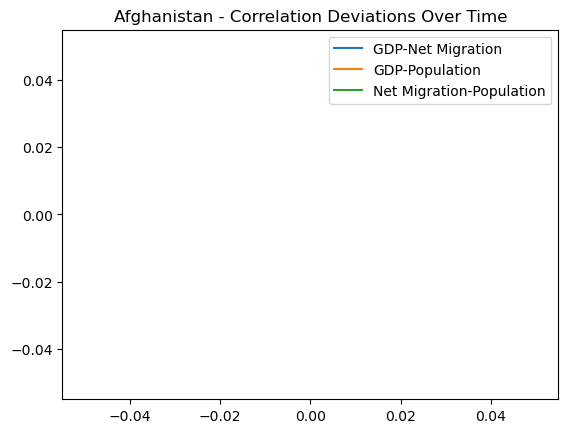

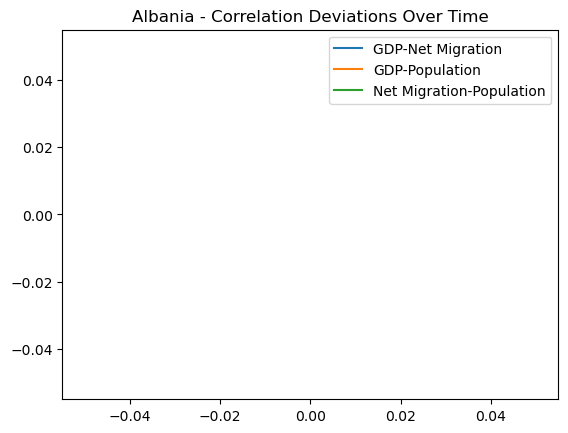

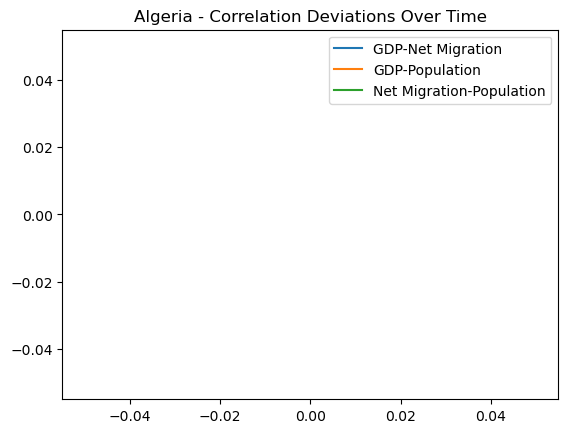

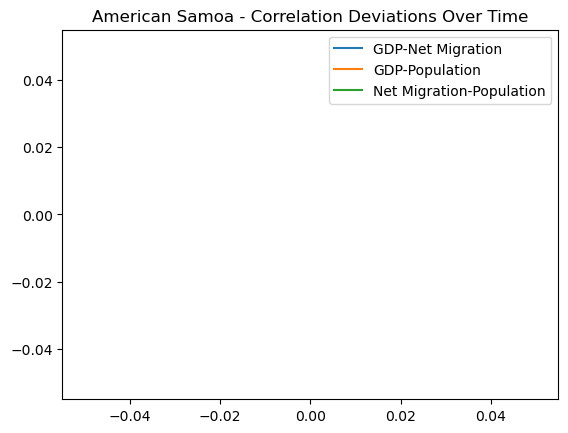

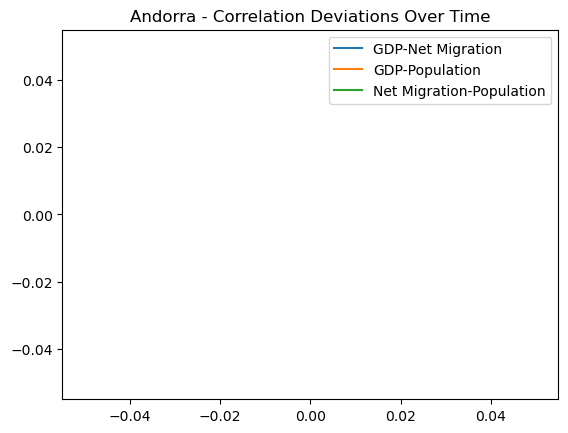

In [66]:
import matplotlib.pyplot as plt

for country in correlations['Country Name'].unique()[:5]:  # Limit to the first 5 countries for simplicity
    subset = correlations[correlations['Country Name'] == country]
    plt.plot(subset['Year'], subset['GDP-Net Migration Deviation'], label='GDP-Net Migration')
    plt.plot(subset['Year'], subset['GDP-Population Deviation'], label='GDP-Population')
    plt.plot(subset['Year'], subset['Net Migration-Population Deviation'], label='Net Migration-Population')
    plt.title(f'{country} - Correlation Deviations Over Time')
    plt.legend()
    plt.show()


Rolling Window Correlation

In [67]:
from scipy.stats import zscore

correlations['GDP-Net Migration Z'] = zscore(correlations['GDP-Net Migration Deviation'])
correlations['GDP-Population Z'] = zscore(correlations['GDP-Population Deviation'])
correlations['Net Migration-Population Z'] = zscore(correlations['Net Migration-Population Deviation'])

significant_deviations = correlations[
    (correlations['GDP-Net Migration Z'].abs() > 2) |
    (correlations['GDP-Population Z'].abs() > 2) |
    (correlations['Net Migration-Population Z'].abs() > 2)
]
significant_deviations

,Country Name,Year,GDP-Net Migration,GDP-Population,Net Migration-Population,Year_mean,GDP-Net Migration_mean,GDP-Population_mean,Net Migration-Population_mean,GDP-Net Migration Deviation,GDP-Population Deviation,Net Migration-Population Deviation,GDP-Net Migration Z,GDP-Population Z,Net Migration-Population Z


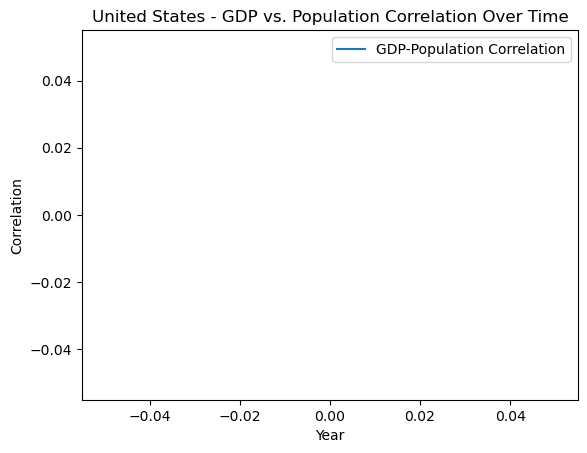

In [68]:
import matplotlib.pyplot as plt

# Plot GDP-Population correlation over time for a specific country
country = 'United States'  # Example; replace with any country name

subset = correlations[correlations['Country Name'] == country]
plt.plot(subset['Year'], subset['GDP-Population'], label='GDP-Population Correlation')
plt.title(f'{country} - GDP vs. Population Correlation Over Time')
plt.xlabel('Year')
plt.ylabel('Correlation')
plt.legend()
plt.show()


In [69]:
import pandas as pd
import plotly.graph_objects as go



# Reshape the GDP dataframe
df_gdp_melted = df_gdp.melt(id_vars=["Country Name", "Country Code"], 
                            var_name="Year", 
                            value_name="GDP (current US$)", 
                            value_vars=df_gdp.columns[4:68])
df_gdp_melted["Year"] = pd.to_numeric(df_gdp_melted["Year"])

# Reshape the Population dataframe
df_pop_melted = df_pop.melt(id_vars=["Country Name", "Country Code"], 
                            var_name="Year", 
                            value_name="Current Population", 
                            value_vars=df_pop.columns[4:68])
df_pop_melted["Year"] = pd.to_numeric(df_pop_melted["Year"])

# Filter the data for the United States
df_us_gdp = df_gdp_melted[df_gdp_melted["Country Name"] == "United States"]
df_us_pop = df_pop_melted[df_pop_melted["Country Name"] == "United States"]

# Create the figure
fig = go.Figure()

# Add GDP trace
fig.add_trace(go.Scatter(
    x=df_us_gdp["Year"],
    y=df_us_gdp["GDP (current US$)"],
    mode='lines',
    name='GDP (current US$)',
    line=dict(color='blue')
))

# Add Population trace
fig.add_trace(go.Scatter(
    x=df_us_pop["Year"],
    y=df_us_pop["Current Population"],
    mode='lines',
    name='Current Population',
    line=dict(color='red'),
    yaxis='y2'
))

# Update layout
fig.update_layout(
    title="GDP and Population of the United States Over Time",
    xaxis_title="Year",
    yaxis=dict(
        title="GDP (current US$)",
        titlefont=dict(color="blue"),
        tickfont=dict(color="blue")
    ),
    yaxis2=dict(
        title="Current Population",
        titlefont=dict(color="red"),
        tickfont=dict(color="red"),
        overlaying='y',
        side='right'
    ),
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1
    )
)

fig.show()

GDP vs Population Line Chart 

In [70]:
import pandas as pd
import plotly.graph_objects as go

# Add initial traces for the United States
initial_country = "United States"
df_us_gdp = df_gdp_melted[df_gdp_melted["Country Name"] == initial_country]
df_us_pop = df_pop_melted[df_pop_melted["Country Name"] == initial_country]

fig = go.Figure()

# Define the initial traces with a single set of labels
fig.add_trace(go.Scatter(
    x=df_us_gdp["Year"],
    y=df_us_gdp["GDP (current US$)"],
    mode='lines',
    name='GDP (current US$)',
    line=dict(color='blue')
))

fig.add_trace(go.Scatter(
    x=df_us_pop["Year"],
    y=df_us_pop["Current Population"],
    mode='lines',
    name='Current Population',
    line=dict(color='red'),
    yaxis='y2'
))

# Create a list of unique countries
countries = df_gdp_melted["Country Name"].unique()

# Create dropdown menu
dropdown_buttons = [
    {
        'label': country,
        'method': 'update',
        'args': [
            {
                'x': [
                    df_gdp_melted[df_gdp_melted["Country Name"] == country]["Year"],
                    df_pop_melted[df_pop_melted["Country Name"] == country]["Year"]
                ],
                'y': [
                    df_gdp_melted[df_gdp_melted["Country Name"] == country]["GDP (current US$)"],
                    df_pop_melted[df_pop_melted["Country Name"] == country]["Current Population"]
                ]
            },
            {
                'title': f"GDP and Population of {country} Over Time",
                'showlegend': True
            }
        ]
    }
    for country in countries
]

# Update layout with dropdown menu
fig.update_layout(
    title="GDP and Population of the United States Over Time",
    xaxis_title="Year",
    yaxis=dict(
        title="GDP (current US$)",
        titlefont=dict(color="blue"),
        tickfont=dict(color="blue")
    ),
    yaxis2=dict(
        title="Current Population",
        titlefont=dict(color="red"),
        tickfont=dict(color="red"),
        overlaying='y',
        side='right'
    ),
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1
    ),
    updatemenus=[
        {
            'buttons': dropdown_buttons,
            'direction': 'down',
            'showactive': True,
            'x': 0.17,
            'xanchor': 'left',
            'y': 1.15,
            'yanchor': 'top'
        }
    ]
)

fig.show()


In [71]:
import pandas as pd
import plotly.graph_objects as go

# Assuming df_gdp_melted, df_mig_melted, and df_pop_melted are already defined and loaded

# Set the initial country and metrics for the graph
initial_country = "United States"
initial_y1_metric = "GDP (current US$)"
initial_y3_metric = "Net Migration"

# Filter data for the initial country
df_gdp = df_gdp_melted[df_gdp_melted["Country Name"] == initial_country]
df_pop = df_pop_melted[df_pop_melted["Country Name"] == initial_country]
df_mig = df_mig_melted[df_mig_melted["Country Name"] == initial_country]

# Initialize the figure
fig = go.Figure()

# Add initial traces for y1 (left axis) and y3 (right axis)
fig.add_trace(go.Scatter(
    x=df_gdp["Year"],
    y=df_gdp["GDP (current US$)"],
    mode='lines',
    name='GDP (current US$)',
    line=dict(color='blue'),
    yaxis='y'
))

fig.add_trace(go.Scatter(
    x=df_mig["Year"],
    y=df_mig["Net Migration"],
    mode='lines',
    name='Net Migration',
    line=dict(color='green'),
    yaxis='y3'
))

# Create a list of unique countries
countries = df_gdp_melted["Country Name"].unique()

# Create dropdown menu for selecting countries
country_dropdown_buttons = [
    {
        'label': country,
        'method': 'update',
        'args': [
            {
                'x': [
                    df_gdp_melted[df_gdp_melted["Country Name"] == country]["Year"],
                    df_mig_melted[df_mig_melted["Country Name"] == country]["Year"]
                ],
                'y': [
                    df_gdp_melted[df_gdp_melted["Country Name"] == country][initial_y1_metric],
                    df_mig_melted[df_mig_melted["Country Name"] == country][initial_y3_metric]
                ]
            },
            {
                'title': f"{initial_y1_metric} and {initial_y3_metric} of {country} Over Time"
            }
        ]
    }
    for country in countries
]

# Create dropdown menu for selecting metrics
metric_options = {
    "GDP (current US$)": df_gdp_melted,
    "Current Population": df_pop_melted,
    "Net Migration": df_mig_melted
}

metric_dropdown_buttons = [
    {
        'label': f"{y1_metric} (y1) vs {y3_metric} (y3)",
        'method': 'update',
        'args': [
            {
                'y': [
                    metric_options[y1_metric][metric_options[y1_metric]["Country Name"] == initial_country][y1_metric],
                    metric_options[y3_metric][metric_options[y3_metric]["Country Name"] == initial_country][y3_metric]
                ]
            },
            {
                'title': f"{y1_metric} and {y3_metric} of {initial_country} Over Time",
                'yaxis': {'title': y1_metric, 'titlefont': {'color': 'blue'}, 'tickfont': {'color': 'blue'}},
                'yaxis3': {'title': y3_metric, 'titlefont': {'color': 'green'}, 'tickfont': {'color': 'green'}}
            }
        ]
    }
    for y1_metric in metric_options.keys() for y3_metric in metric_options.keys() if y1_metric != y3_metric
]

# Update layout with dropdown menus, axis configuration, and improved margins
fig.update_layout(
    width=800,  # Adjust figure width
    margin=dict(l=100, r=100, t=80),  # Adjust margins
    yaxis=dict(
        title=initial_y1_metric,
        titlefont=dict(color="blue"),
        tickfont=dict(color="blue"),
        showgrid=True,
        position=0  # Position y1 axis to the left
    ),
    yaxis2=dict(
        title="Current Population",  # Default title for the right axis
        titlefont=dict(color="red"),
        tickfont=dict(color="red"),
        overlaying='y',
        side='right',
        showgrid=False
    ),
    yaxis3=dict(
        title=initial_y3_metric,
        titlefont=dict(color="green"),
        tickfont=dict(color="green"),
        overlaying='y',
        side='left',
        position=0.05,  # Position y3 axis slightly to the right
        showgrid=False
    ),
    title=dict(
        text=f"{initial_y1_metric} and {initial_y3_metric} Over Time",
        x=0.5,
        y=0.93
    ),
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1
    ),
    updatemenus=[
        {
            'buttons': country_dropdown_buttons,
            'direction': 'down',
            'showactive': True,
            'x': 0.17,
            'xanchor': 'left',
            'y': 1.15,
            'yanchor': 'top',
            'pad': {'r': 10}  # Padding between dropdowns
        },
        {
            'buttons': metric_dropdown_buttons,
            'direction': 'down',
            'showactive': True,
            'x': 0.35,
            'xanchor': 'left',
            'y': 1.15,
            'yanchor': 'top',
            'pad': {'r': 10}
        }
    ]
)

fig.show()


In [72]:
import pandas as pd
import plotly.graph_objects as go

# Assuming df_gdp_melted, df_mig_melted, and df_pop_melted are already defined and loaded

# Set the initial country and metrics for the graph
initial_country = "United States"
initial_y1_metric = "GDP (current US$)"
initial_y3_metric = "Net Migration"

# Filter data for the initial country
df_gdp = df_gdp_melted[df_gdp_melted["Country Name"] == initial_country]
df_pop = df_pop_melted[df_pop_melted["Country Name"] == initial_country]
df_mig = df_mig_melted[df_mig_melted["Country Name"] == initial_country]

# Initialize the figure
fig = go.Figure()

# Add initial traces for y1 (left axis), y2 (fixed population axis), and y3 (right axis)
fig.add_trace(go.Scatter(
    x=df_gdp["Year"],
    y=df_gdp["GDP (current US$)"],
    mode='lines',
    name='GDP (current US$)',
    line=dict(color='blue'),
    yaxis='y'
))

fig.add_trace(go.Scatter(
    x=df_pop["Year"],
    y=df_pop["Current Population"],
    mode='lines',
    name='Current Population',
    line=dict(color='red'),
    yaxis='y2'
))

fig.add_trace(go.Scatter(
    x=df_mig["Year"],
    y=df_mig["Net Migration"],
    mode='lines',
    name='Net Migration',
    line=dict(color='green'),
    yaxis='y3'
))

# Create a list of unique countries
countries = df_gdp_melted["Country Name"].unique()

# Create dropdown menu for selecting countries
country_dropdown_buttons = [
    {
        'label': country,
        'method': 'update',
        'args': [
            {
                'x': [
                    df_gdp_melted[df_gdp_melted["Country Name"] == country]["Year"],
                    df_pop_melted[df_pop_melted["Country Name"] == country]["Year"],
                    df_mig_melted[df_mig_melted["Country Name"] == country]["Year"]
                ],
                'y': [
                    df_gdp_melted[df_gdp_melted["Country Name"] == country][initial_y1_metric],
                    df_pop_melted[df_pop_melted["Country Name"] == country]["Current Population"],
                    df_mig_melted[df_mig_melted["Country Name"] == country][initial_y3_metric]
                ]
            },
            {
                'title': f"{initial_y1_metric}, Population, and {initial_y3_metric} of {country} Over Time"
            }
        ]
    }
    for country in countries
]

# Create dropdown menu for selecting metrics for y1 and y3 axes
metric_options = {
    "GDP (current US$)": df_gdp_melted,
    "Current Population": df_pop_melted,
    "Net Migration": df_mig_melted
}

metric_dropdown_buttons = [
    {
        'label': f"{y1_metric} (y1) vs {y3_metric} (y3)",
        'method': 'update',
        'args': [
            {
                'y': [
                    metric_options[y1_metric][metric_options[y1_metric]["Country Name"] == initial_country][y1_metric],
                    df_pop_melted[df_pop_melted["Country Name"] == initial_country]["Current Population"],
                    metric_options[y3_metric][metric_options[y3_metric]["Country Name"] == initial_country][y3_metric]
                ]
            },
            {
                'title': f"{y1_metric}, Population, and {y3_metric} of {initial_country} Over Time",
                'yaxis': {'title': y1_metric, 'titlefont': {'color': 'blue'}, 'tickfont': {'color': 'blue'}},
                'yaxis2': {'title': "Current Population", 'titlefont': {'color': 'red'}, 'tickfont': {'color': 'red'}},
                'yaxis3': {'title': y3_metric, 'titlefont': {'color': 'green'}, 'tickfont': {'color': 'green'}}
            }
        ]
    }
    for y1_metric in metric_options.keys() for y3_metric in metric_options.keys() if y1_metric != y3_metric
]

# Update layout with dropdown menus, fixed population axis (y2), and improved margins
fig.update_layout(
    width=800,  # Adjust figure width
    margin=dict(l=100, r=100, t=80),  # Adjust margins
    yaxis=dict(
        title=initial_y1_metric,
        titlefont=dict(color="blue"),
        tickfont=dict(color="blue"),
        showgrid=True,
        position=0  # Position y1 axis to the left
    ),
    yaxis2=dict(
        title="Current Population",  # Fixed title for the middle y2 axis
        titlefont=dict(color="red"),
        tickfont=dict(color="red"),
        overlaying='y',
        side='right',
        showgrid=False
    ),
    yaxis3=dict(
        title=initial_y3_metric,
        titlefont=dict(color="green"),
        tickfont=dict(color="green"),
        overlaying='y',
        side='left',
        position=0.05,  # Position y3 axis slightly to the right
        showgrid=False
    ),
    title=dict(
        text=f"{initial_y1_metric}, Population, and {initial_y3_metric} Over Time",
        x=0.5,
        y=0.93
    ),
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1
    ),
    updatemenus=[
        {
            'buttons': country_dropdown_buttons,
            'direction': 'down',
            'showactive': True,
            'x': 0.17,
            'xanchor': 'left',
            'y': 1.15,
            'yanchor': 'top',
            'pad': {'r': 10}  # Padding between dropdowns
        },
        {
            'buttons': metric_dropdown_buttons,
            'direction': 'down',
            'showactive': True,
            'x': 0.35,
            'xanchor': 'left',
            'y': 1.15,
            'yanchor': 'top',
            'pad': {'r': 10}
        }
    ]
)

fig.show()
